##### Copyright 2018 The TensorFlow Authors.




In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Import Library

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import glob
import collections
import random
import numpy as np 
import pandas as pd
import os
from time import time
import json
from PIL import Image
import re
from pickle import dump, load
from tqdm import tqdm

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
%cd /content/drive/MyDrive/045195/Image Captioning/

/content/drive/.shortcut-targets-by-id/1hYBu2dg8bbpIOHMO_a2OlNrlP_NkFuKV/Image Captioning


# Flickr 8k dataset

In [4]:
df = pd.read_csv('./captions.txt')
df

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .


In [5]:
image_path = './Images/'

img = Image.open(image_path + df['image'][5*100])
print(img.size)

(500, 375)


500    A black and white Border Collie catches a Fris...
501    a brown and white dog catches a Frisbee in it ...
502    A brown and white dug jumping up to catch a Fr...
503    A dog jumps to catch a Frisbee , while many pe...
504    An agile dog catches a Frisbee while a crowd o...
Name: caption, dtype: object


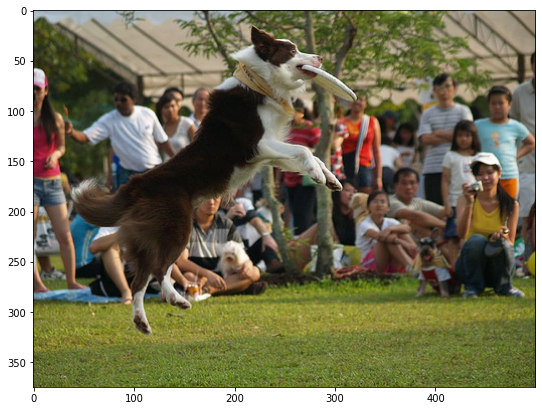

In [ ]:
# Show image and 5 captions
plt.figure(figsize = (9,9))
plt.imshow(img)
print(df['caption'][5*100:5*101])

# Preprocess the caption

In [6]:
def caption_preprocessing(caption):

  # Remove punctuation from each token
  pattern = r'[^a-zA-z0-9\s]'
  caption = re.sub(pattern, '', caption)
  # Tokenize
  caption = caption.split()
  # Convert to lower
  caption = [word.lower() for word in caption]
  # Remove hanging "'s" and 'a'
  caption = [word for word in caption if len(word) > 1]
  # Remove tokens with number in them
  caption = [word for word in caption if word.isalpha()]

  # Store as string
  caption = ' '.join(caption)
  # Insert 'startseq' and 'endseq into caption
  caption = 'startseq ' + caption + ' endseq'

  return caption

In [7]:
# Example for caption preprocessing

print('Caption before processing: ')
print(df['caption'][2461])
print('Caption after processing: ')
print(caption_preprocessing(df['caption'][2461]))

Caption before processing: 
A group of children in blue uniforms walk to class .
Caption after processing: 
startseq group of children in blue uniforms walk to class endseq


In [8]:
# Preprocessing with all caption
df['caption'] = df['caption'].apply(caption_preprocessing)
print(df['caption'][2461])

startseq group of children in blue uniforms walk to class endseq


In [9]:
# Get images and captions like dict image1:[cap1, cap2, cap3, cap4, cap5]

def load_descriptions(df):
  mapping = dict()

  for i in range(len(df)):
    image_id = df['image'][i]

    if image_id not in mapping:
      mapping[image_id] = list()
    mapping[image_id].append(df['caption'][i])
    
  return mapping

image_dict = load_descriptions(df)
print('Loaded: %d ' % len(image_dict))

Loaded: 8091 


In [10]:
image_dict['1001773457_577c3a7d70.jpg']

['startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tricolored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [11]:
# Get training images name
df1 = pd.read_csv('./Flickr_8k.trainImages.txt')
training_image_names = set(df1['image'])

In [12]:
def subset_data_dict(image_dict, image_names):
  dict = {image_name:captions for image_name, captions in image_dict.items() if image_name in image_names}
  return (dict)

def all_captions(data_dict):
  return ([caption for key, captions in data_dict.items() for caption in captions])

def max_caption_length(captions):
  return max(len(caption.split()) for caption in captions)

def create_tokenizer(data_dict):
  captions = all_captions(data_dict)

  max_caption_words = max_caption_length(captions)
  
  # Initialise a Keras Tokenizer
  tokenizer = Tokenizer()
  
  # Fit it on the captions so that it prepares a vocabulary of all words
  tokenizer.fit_on_texts(captions)
  
  # Get the size of the vocabulary
  vocab_size = len(tokenizer.word_index) + 1

  return (tokenizer, vocab_size, max_caption_words)

In [13]:
training_dict = subset_data_dict(image_dict, training_image_names)

# Prepare tokenizer
tokenizer, vocab_size, max_caption_words = create_tokenizer(training_dict)

In [15]:
print(len(training_dict))
print(vocab_size)
print(max_caption_words)

6000
7579
34


In [16]:
def pad_text (text, max_length): 
  text = pad_sequences([text], maxlen = max_length, padding='post')[0]
  return (text)

# Preprocess the image using InceptionV3

- Image size is 299x299
- Normalize the image so that it contains pixels in the range of -1 to 1
- You will pre-process each image with InceptionV3 and cache the output to disk. Caching the output in RAM would be faster but also memory intensive, requiring 8 * 8 * 2048 floats per image. At the time of writing, this exceeds the memory limitations of Colab (currently 12GB of memory).

In [17]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

In [18]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

87924736/87910968 [==============================] - 2s 0us/step


In [19]:
training_image_paths = [image_path + name for name in training_image_names]
# Get unique images
encode_train = sorted(set(training_image_paths))
print(encode_train[0])

./Images/1000268201_693b08cb0e.jpg


In [ ]:
# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

# Prepare Training Data using a Tensorflow Dataset

In [20]:
def data_pre(data_dict, tokenizer, max_length, vocab_size):
  X, y = list(), list()

  # For each image and list of captions
  for image_name, captions in data_dict.items():
    image_name = image_path + image_name

    # For each caption in list of captions
    for caption in captions:

      # Convert the caption word into a list of word indices
      word_idxs = tokenizer.texts_to_sequences([caption])[0]

      # Pad the input text to the same fixed length
      pad_idxs = pad_text(word_idxs, max_length)

      X.append(image_name)
      y.append(pad_idxs)
  
  return np.array(X), np.array(y)
  return X, y

train_X, train_y = data_pre(training_dict, tokenizer, max_caption_words, vocab_size)

# Image Caption Model with Attention and GRU

## Model

Fun fact: the decoder below is identical to the one in the example for [Neural Machine Translation with Attention](https://www.tensorflow.org/text/tutorials/nmt_with_attention).

The model architecture is inspired by the [Show, Attend and Tell](https://arxiv.org/pdf/1502.03044.pdf) paper.

* In this example, you extract the features from the lower convolutional layer of InceptionV3 giving us a vector of shape (8, 8, 2048).
* You squash that to a shape of (64, 2048).
* This vector is then passed through the CNN Encoder (which consists of a single Fully connected layer).
* The RNN (here GRU) attends over the image to predict the next word.

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((train_X, train_y))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform',
                                   kernel_regularizer=tf.keras.regularizers.l2(1e-8))
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)
  
  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
num_steps = len(train_X) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

In [ ]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## Checkpoint

In [ ]:
checkpoint_path = "/content/drive/MyDrive/045195/Image Captioning/checkpoints/GRU_attention/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

## Training

* You extract the features stored in the respective `.npy` files and then pass those features through the encoder.
* The encoder output, hidden state(initialized to 0) and the decoder input (which is the start token) is passed to the decoder.
* The decoder returns the predictions and the decoder hidden state.
* The decoder hidden state is then passed back into the model and the predictions are used to calculate the loss.
* Use teacher forcing to decide the next input to the decoder.
* Teacher forcing is the technique where the target word is passed as the next input to the decoder.
* The final step is to calculate the gradients and apply it to the optimizer and backpropagate.

In [ ]:
loss_plot = []
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['startseq']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
import time
start_epoch = 0
EPOCHS = 25

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)
    
    if (epoch+1) % 5 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 2.5618
Epoch 1 Batch 100 Loss 1.5300
Epoch 1 Batch 200 Loss 1.2686
Epoch 1 Batch 300 Loss 1.1959
Epoch 1 Batch 400 Loss 1.2339
Epoch 1 Loss 1.432868
Time taken for 1 epoch 249.03 sec

Epoch 2 Batch 0 Loss 1.2305
Epoch 2 Batch 100 Loss 1.1561
Epoch 2 Batch 200 Loss 1.0374
Epoch 2 Batch 300 Loss 0.9823
Epoch 2 Batch 400 Loss 1.0160
Epoch 2 Loss 1.120310
Time taken for 1 epoch 163.41 sec

Epoch 3 Batch 0 Loss 1.1744
Epoch 3 Batch 100 Loss 0.9851
Epoch 3 Batch 200 Loss 1.0309
Epoch 3 Batch 300 Loss 0.8342
Epoch 3 Batch 400 Loss 0.9265
Epoch 3 Loss 1.004230
Time taken for 1 epoch 163.33 sec

Epoch 4 Batch 0 Loss 1.0119
Epoch 4 Batch 100 Loss 0.9753
Epoch 4 Batch 200 Loss 0.8814
Epoch 4 Batch 300 Loss 0.9049
Epoch 4 Batch 400 Loss 0.8604
Epoch 4 Loss 0.924973
Time taken for 1 epoch 163.11 sec

Epoch 5 Batch 0 Loss 0.9440
Epoch 5 Batch 100 Loss 0.8592
Epoch 5 Batch 200 Loss 0.8200
Epoch 5 Batch 300 Loss 0.7240
Epoch 5 Batch 400 Loss 0.8124
Epoch 5 Loss 0.860591
Time taken

In [ ]:
import time
start_epoch = 20
EPOCHS = 50

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)
    
    if (epoch+1) % 5 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 21 Batch 0 Loss 0.4102
Epoch 21 Batch 100 Loss 0.3601
Epoch 21 Batch 200 Loss 0.3962
Epoch 21 Batch 300 Loss 0.3887
Epoch 21 Batch 400 Loss 0.3674
Epoch 21 Loss 0.376126
Time taken for 1 epoch 191.88 sec

Epoch 22 Batch 0 Loss 0.4205
Epoch 22 Batch 100 Loss 0.3152
Epoch 22 Batch 200 Loss 0.3764
Epoch 22 Batch 300 Loss 0.4041
Epoch 22 Batch 400 Loss 0.3720
Epoch 22 Loss 0.361888
Time taken for 1 epoch 161.85 sec

Epoch 23 Batch 0 Loss 0.3673
Epoch 23 Batch 100 Loss 0.3460
Epoch 23 Batch 200 Loss 0.3542
Epoch 23 Batch 300 Loss 0.3809
Epoch 23 Batch 400 Loss 0.3717
Epoch 23 Loss 0.349039
Time taken for 1 epoch 162.00 sec

Epoch 24 Batch 0 Loss 0.4080
Epoch 24 Batch 100 Loss 0.3553
Epoch 24 Batch 200 Loss 0.3493
Epoch 24 Batch 300 Loss 0.3171
Epoch 24 Batch 400 Loss 0.3320
Epoch 24 Loss 0.337047
Time taken for 1 epoch 161.44 sec

Epoch 25 Batch 0 Loss 0.3719
Epoch 25 Batch 100 Loss 0.3532
Epoch 25 Batch 200 Loss 0.3103
Epoch 25 Batch 300 Loss 0.3165
Epoch 25 Batch 400 Loss 0.3253
Epo

In [ ]:
loss_plot = [1.432868, 1.120310, 1.004230, 0.924973, 0.860591, 0.805149, 0.756265, 0.713286, 0.672584, 0.637335, 0.604081, 0.571730, 0.542919, 0.517066, 0.492430, 0.470604, 0.447926, 0.427599, 0.409359, 0.392586, 0.376126, 0.361888, 0.349039, 0.337047, 0.325571, 0.312219, 0.304485, 0.296968, 0.286950, 0.280138, 0.272562, 0.266952, 0.261112, 0.256545, 0.251849, 0.243776, 0.240682, 0.236930, 0.234644, 0.229745, 0.227102, 0.221901, 0.220073, 0.219145, 0.215147, 0.213136, 0.211652, 0.208036, 0.206095, 0.203603]

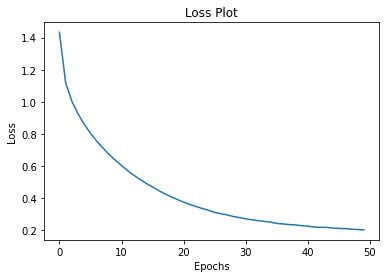

In [ ]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

## Evaluate

In [ ]:
def evaluate(image, max_length):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['startseq']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == 'endseq':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [ ]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i], (8, 8))
        grid_size = max(int(np.ceil(len_result/2)), 2)
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Real Caption: ['startseq man in blue pants repels off cliff over water endseq', 'startseq man is hanging by line off cliff above water endseq', 'startseq an individual rappelling down cliff towards the water endseq', 'startseq person hangs from rope on cliff endseq', 'startseq someone dangles on rope from rocky cliff over the ocean endseq']
Prediction Caption: man is rock climber endseq


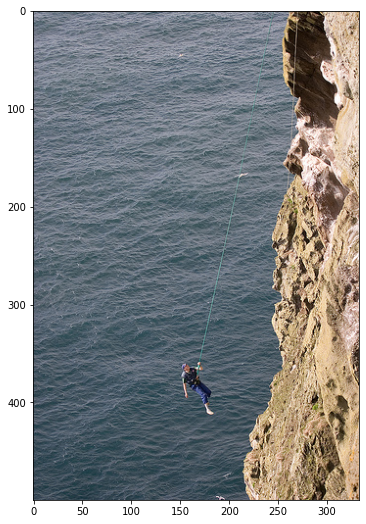

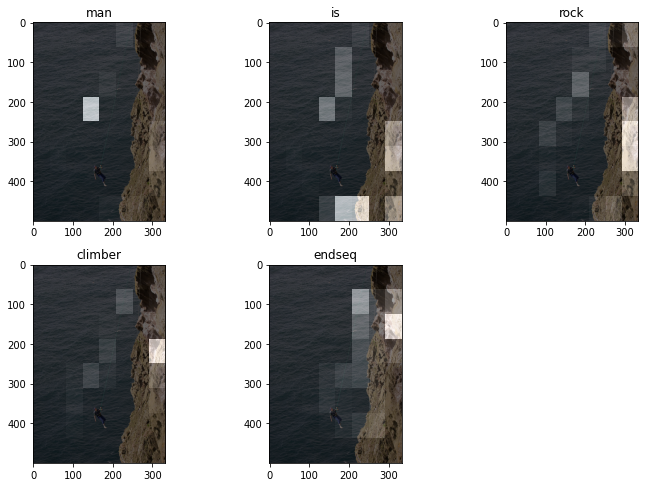

In [ ]:
def check_test(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  rid = np.random.randint(0, len(test_image_names))
  image_name = test_image_names[rid]
  real_caption = image_dict[image_name]

  image_path = image_dir + image_name
  result, attention_plot = evaluate(image_path, max_caption_words)

  #from IPython.display import Image, display
  #display(Image(image_path))
  print('Real Caption:', real_caption)
  print('Prediction Caption:', ' '.join(result))

  image_name = './Images/' + image_name
  img = Image.open(image_name)
  plt.figure(figsize = (9,9))
  plt.imshow(img)
  plot_attention(image_name, result, attention_plot)
  

  
df2 = pd.read_csv( "./Flickr_8k.testImages.txt")
test_image_names = set(df2['image'])
image_dir = image_path
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq dog with frisbee in front of brown dog endseq', 'startseq large black dog is catching frisbee while large brown dog follows shortly after endseq', 'startseq two dark colored dogs romp in the grass with blue frisbee endseq', 'startseq two dogs are catching blue frisbees in grass endseq', 'startseq two dogs are playing one is catching frisbee endseq']
Prediction Caption: brown dog playing with green frisbee in the background endseq


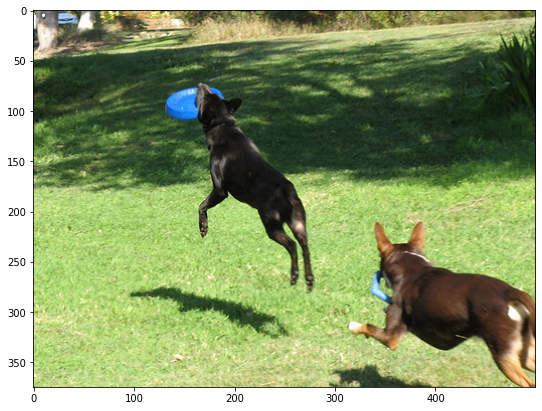

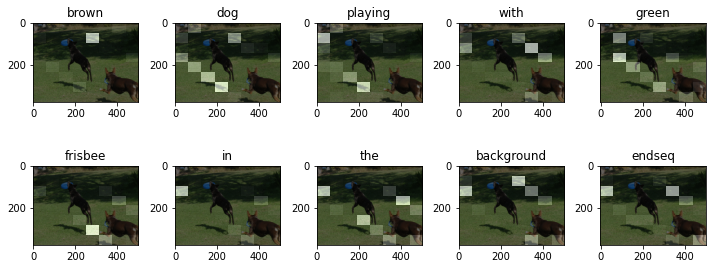

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq several basketball players are grabbing for the ball during game endseq', 'startseq the basketball player in white holds the ball endseq', 'startseq three basketball players leap to grab ball endseq', 'startseq three men are playing game of basketball endseq', 'startseq three men are playing basketball endseq']
Prediction Caption: the basketball player is playing basketball in front of the ball endseq


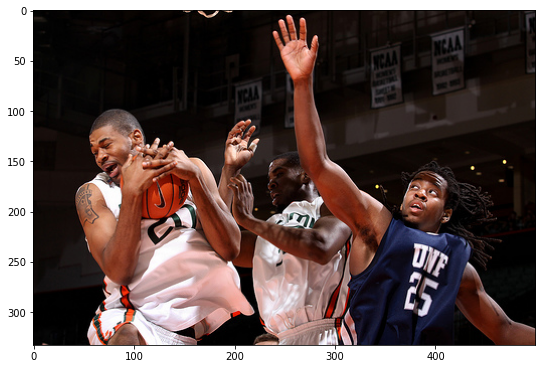

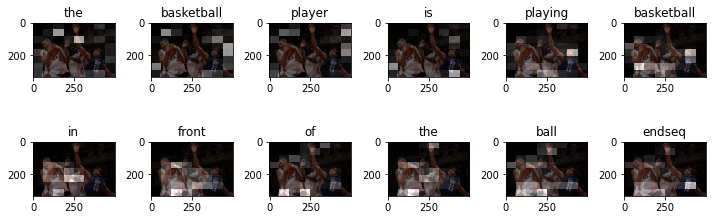

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq couple in parking lot endseq', 'startseq couple walks past car in parking lot endseq', 'startseq man and woman are walking past car with fancy symbol on the front endseq', 'startseq man and woman walk past red car with silver hood ornament endseq', 'startseq man and woman walking next to red car with an unusual hood ornament endseq']
Prediction Caption: two girls several asian girls with purple shirt riding her endseq


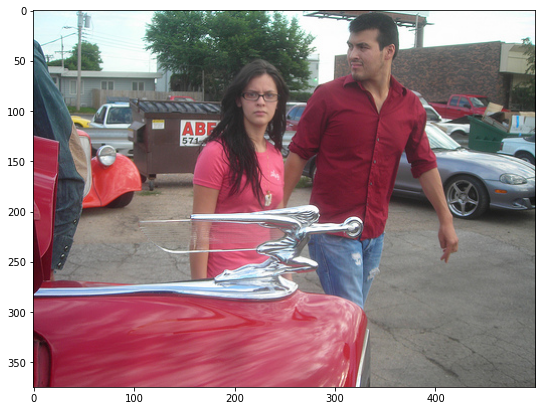

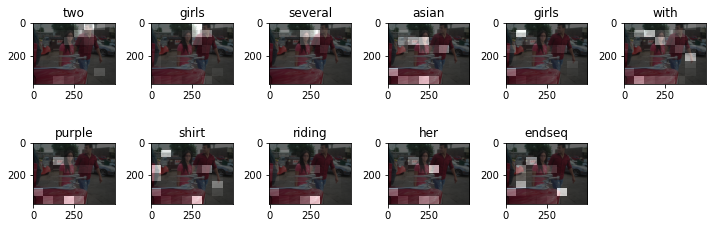

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq crowd of people walk down busy sidewalk endseq', 'startseq group of different people are walking in all different directions in city endseq', 'startseq group of people walking city street in warm weather endseq', 'startseq busy intersection in the summer time in city endseq', 'startseq people in summer clothes are walking on the sidewalk of large city endseq']
Prediction Caption: some girls walking down the street endseq


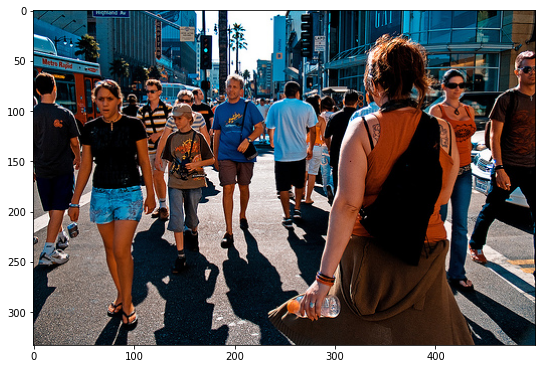

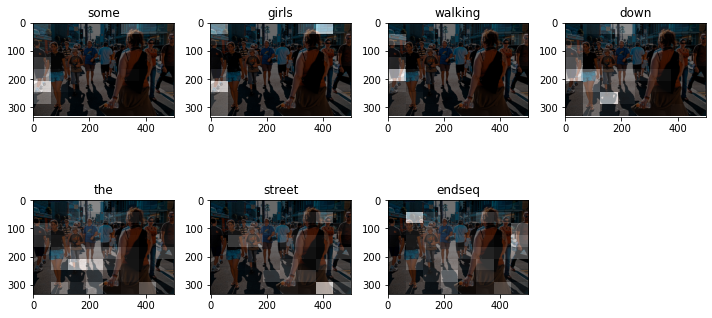

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

In [ ]:
import nltk.translate.bleu_score as bleu
from nltk.translate.bleu_score import SmoothingFunction

smoothie = SmoothingFunction().method4

def bleu_score(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  bleu_score = []
  for id in range(len(test_image_names)):
  # for id in range(10):
    image_name = test_image_names[id]
    real_caption = image_dict[image_name]
    image_path = image_dir + image_name
    result = evaluate(image_path, max_caption_words)
    
    reference_translation = [str(real_caption[0]).split(),
                             str(real_caption[1]).split(),
                             str(real_caption[2]).split(),
                             str(real_caption[3]).split(),
                             str(real_caption[4]).split()
                            ]
    candidate_translation = result[0]
    
    score = bleu.sentence_bleu(reference_translation, candidate_translation, smoothing_function=smoothie)
    # print(result)
    #print(reference_translation)
    # print(score)
    bleu_score.append(score)
  
  bleu_score_avg = sum(bleu_score) / len(bleu_score)
  return bleu_score_avg

score = bleu_score(list(test_image_names), image_dict, image_dir, max_caption_words)
print(score)

0.18994129263547235


# Image Caption Model with Attention and LSTM

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((train_X, train_y))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## Model

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)

    self.rnn = tf.keras.layers.LSTM(self.units, 
                                    return_sequences=True, 
                                    return_state=True,
                                    recurrent_initializer='glorot_uniform',
                                    kernel_regularizer=tf.keras.regularizers.l2(1e-8))


    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)
  
  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the LSTM
    output, state, _ = self.rnn(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
num_steps = len(train_X) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

In [ ]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## Checkpoint

In [ ]:
checkpoint_path = "/content/drive/MyDrive/045195/Image Captioning/checkpoints/LSTM_attention/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

## Training

In [ ]:
loss_plot = []
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['startseq']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
import time
start_epoch = 0
EPOCHS = 50

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)
    
    if (epoch+1) % 5 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 2.6922
Epoch 1 Batch 100 Loss 1.7701
Epoch 1 Batch 200 Loss 1.4921
Epoch 1 Batch 300 Loss 1.2163
Epoch 1 Batch 400 Loss 1.3394
Epoch 1 Loss 1.486986
Time taken for 1 epoch 263.24 sec

Epoch 2 Batch 0 Loss 1.2883
Epoch 2 Batch 100 Loss 1.1483
Epoch 2 Batch 200 Loss 1.1262
Epoch 2 Batch 300 Loss 1.0530
Epoch 2 Batch 400 Loss 1.2190
Epoch 2 Loss 1.140676
Time taken for 1 epoch 169.89 sec

Epoch 3 Batch 0 Loss 1.0823
Epoch 3 Batch 100 Loss 1.1253
Epoch 3 Batch 200 Loss 1.0359
Epoch 3 Batch 300 Loss 0.9589
Epoch 3 Batch 400 Loss 0.9568
Epoch 3 Loss 1.020271
Time taken for 1 epoch 170.44 sec

Epoch 4 Batch 0 Loss 1.1400
Epoch 4 Batch 100 Loss 0.8063
Epoch 4 Batch 200 Loss 1.0634
Epoch 4 Batch 300 Loss 0.9877
Epoch 4 Batch 400 Loss 0.9433
Epoch 4 Loss 0.939382
Time taken for 1 epoch 170.78 sec

Epoch 5 Batch 0 Loss 0.8367
Epoch 5 Batch 100 Loss 0.9908
Epoch 5 Batch 200 Loss 0.8157
Epoch 5 Batch 300 Loss 0.8554
Epoch 5 Batch 400 Loss 0.7953
Epoch 5 Loss 0.873987
Time taken

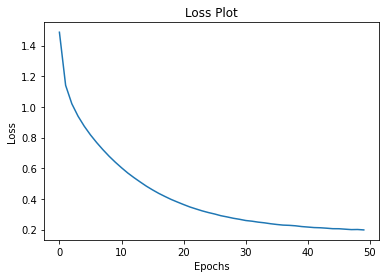

In [ ]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

## Evaluate

In [ ]:
def evaluate(image, max_length):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['startseq']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == 'endseq':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [ ]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i], (8, 8))
        grid_size = max(int(np.ceil(len_result/2)), 2)
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Real Caption: ['startseq dog with frisbee in front of brown dog endseq', 'startseq large black dog is catching frisbee while large brown dog follows shortly after endseq', 'startseq two dark colored dogs romp in the grass with blue frisbee endseq', 'startseq two dogs are catching blue frisbees in grass endseq', 'startseq two dogs are playing one is catching frisbee endseq']
Prediction Caption: black dog running through the air endseq


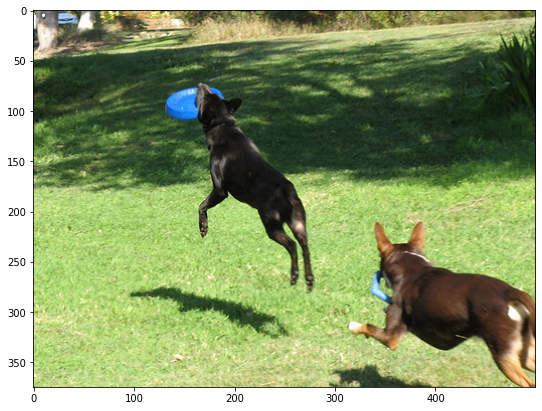

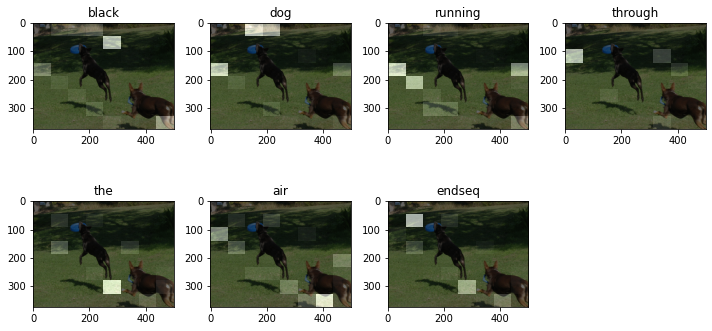

In [ ]:
def check_test(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  rid = np.random.randint(0, len(test_image_names))
  image_name = test_image_names[rid]
  real_caption = image_dict[image_name]

  image_path = image_dir + image_name
  result, attention_plot = evaluate(image_path, max_caption_words)

  #from IPython.display import Image, display
  #display(Image(image_path))
  print('Real Caption:', real_caption)
  print('Prediction Caption:', ' '.join(result))

  image_name = './Images/' + image_name
  img = Image.open(image_name)
  plt.figure(figsize = (9,9))
  plt.imshow(img)
  plot_attention(image_name, result, attention_plot)

  
df2 = pd.read_csv( "./Flickr_8k.testImages.txt")
test_image_names = set(df2['image'])
image_dir = image_path
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq boy wearing white shirt and pink shoelaces jumping on railing endseq', 'startseq man jumps of the handrail of an outdoor staircase endseq', 'startseq person on skateboard endseq', 'startseq skateboarder is balancing on the rail of stairs endseq', 'startseq teenage boy jumps off rail endseq']
Prediction Caption: the guy is jumping down handrail of van endseq


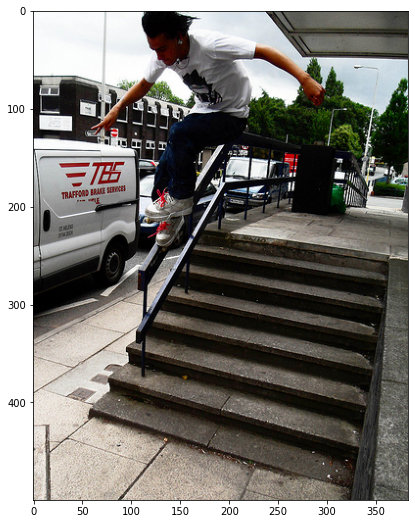

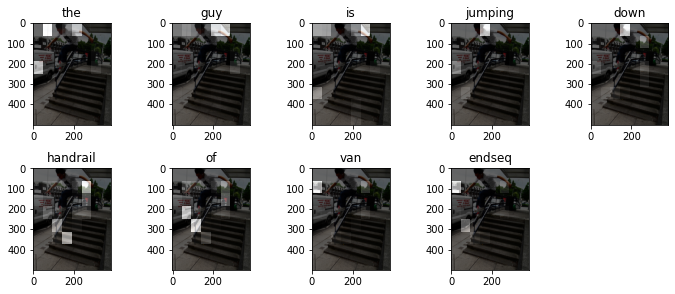

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq black dog paddles behind black cat in body of water endseq', 'startseq dog and cat are swimming in swimming pool endseq', 'startseq two black dogs are dog paddling in sparkling blue pool endseq', 'startseq two black dogs are swimming in pool endseq', 'startseq two dogs swimming in pool endseq']
Prediction Caption: two identical brown dog in water endseq


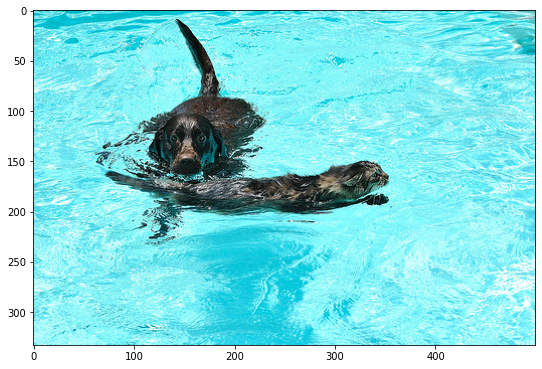

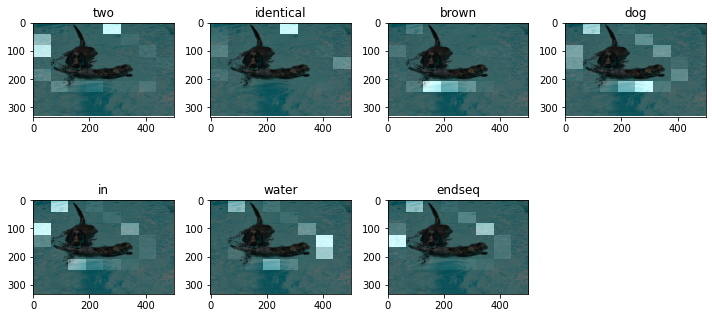

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq the dogs are in the snow in front of fence endseq', 'startseq the dogs play on the snow endseq', 'startseq two brown dogs playfully fight in the snow endseq', 'startseq two brown dogs wrestle in the snow endseq', 'startseq two dogs playing in the snow endseq']
Prediction Caption: the black and brown dog with brown dog are photographed in the snow endseq


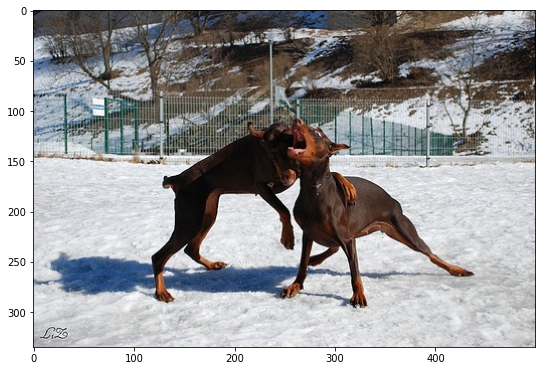

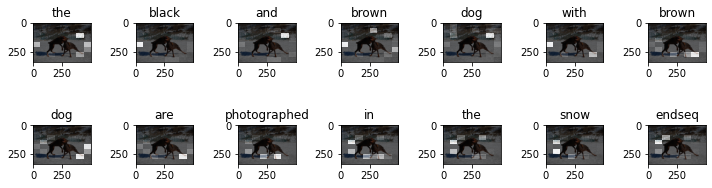

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq man in yellow jacket is riding horse through the mountains endseq', 'startseq man rides horse while mountains and clouds are shown in the background endseq', 'startseq man riding brown horse poses in front of mountain scene endseq', 'startseq man sits on horse with mountains in the background endseq', 'startseq man sitting on brown horse with mountains in background endseq']
Prediction Caption: man and light mountains endseq


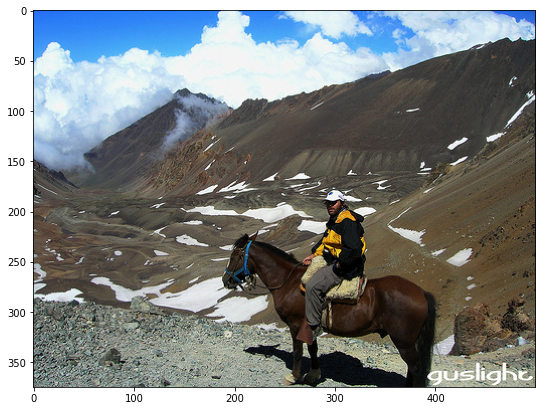

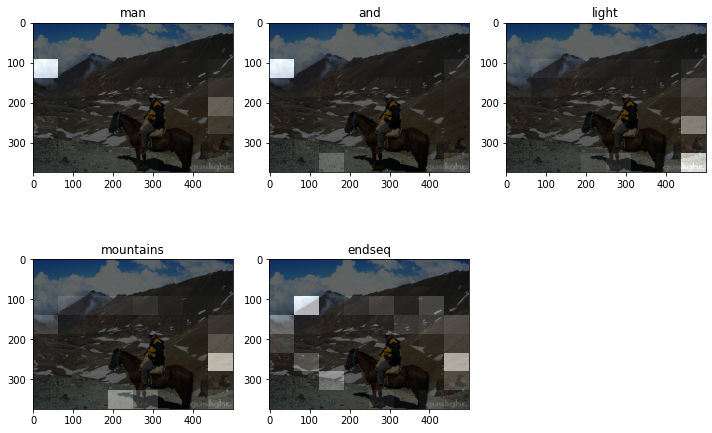

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

In [ ]:
import nltk.translate.bleu_score as bleu
from nltk.translate.bleu_score import SmoothingFunction

smoothie = SmoothingFunction().method4

def bleu_score(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  bleu_score = []
  for id in range(len(test_image_names)):
  # for id in range(10):
    image_name = test_image_names[id]
    real_caption = image_dict[image_name]
    image_path = image_dir + image_name
    result = evaluate(image_path, max_caption_words)
    
    reference_translation = [str(real_caption[0]).split(),
                             str(real_caption[1]).split(),
                             str(real_caption[2]).split(),
                             str(real_caption[3]).split(),
                             str(real_caption[4]).split()
                            ]
    candidate_translation = result[0]
    
    score = bleu.sentence_bleu(reference_translation, candidate_translation, smoothing_function=smoothie)
    # print(result)
    # print(reference_translation)
    # print(score)
    bleu_score.append(score)
  
  bleu_score_avg = sum(bleu_score) / len(bleu_score)
  return bleu_score_avg

score = bleu_score(list(test_image_names), image_dict, image_dir, max_caption_words)
print(score)

0.19620804548311704


# Image Caption Model with LSTM

## Model

In [ ]:
BATCH_SIZE = 1
BUFFER_SIZE = 1000

# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((train_X, train_y))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim, units):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.units = units
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.W1 = tf.keras.layers.Dense(self.units, activation='relu')
        self.W2 = tf.keras.layers.Dense(self.units, activation='relu')

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        y = self.W2(x)
        x = self.W1(x)
        x = tf.reduce_mean(x, axis=1)
        y = tf.reduce_mean(y, axis=1)
        # x, y = (batch_size, units)
        return x, y

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.rnn = tf.keras.layers.LSTM(self.units, 
                                    return_sequences=True, 
                                    return_state=True,
                                    recurrent_initializer='glorot_uniform',
                                    kernel_regularizer=tf.keras.regularizers.l2(0.001),
                                    stateful=True)
    
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

  def call(self, x, hidden, carry):
    
    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # passing the concatenated vector to the LSTM
    output, hidden, carry = self.rnn(x, initial_state=[hidden, carry])

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, hidden, carry

In [ ]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
num_steps = len(train_X) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048

encoder = CNN_Encoder(embedding_dim, units)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

In [ ]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## Checkpoint

In [ ]:
checkpoint_path = "/content/drive/MyDrive/045195/Image Captioning/checkpoints/LSTM/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=20)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print(start_epoch)

9


## Training

In [ ]:
loss_plot = []
@tf.function
def train_step(img_tensor, target):
  loss = 0

  dec_input = tf.expand_dims([tokenizer.word_index['startseq']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      hidden, carry = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, carry = decoder(dec_input, hidden, carry)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
import time
start_epoch = 9
EPOCHS = 10

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 10000 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if (epoch+1) % 1 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 10 Batch 0 Loss 0.7265
Epoch 10 Batch 10000 Loss 0.4465
Epoch 10 Batch 20000 Loss 1.3012
Epoch 10 Loss 0.964383
Time taken for 1 epoch 2529.46 sec



## Evaluate

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print(start_epoch)

9


In [ ]:
def evaluate(image, max_length):

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    
    hidden, carry = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['startseq']], 0)

    result = []

    for i in range(max_length):
        predictions, hidden, carry = decoder(dec_input, hidden, carry)

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == 'endseq':
            return result

        dec_input = tf.expand_dims([predicted_id], 0)
    return result

Real Caption: ['startseq child held by his mother slides down water slide endseq', 'startseq woman holding young boy slide down water slide into pool endseq', 'startseq woman is holding up child as they coming splashing down slide into pool endseq', 'startseq woman is sliding down water slide with little boy on her lap endseq', 'startseq woman slides down purple water slide with small boy on her lap into pool endseq']
Prediction Caption: kid is jumping in the ocean endseq


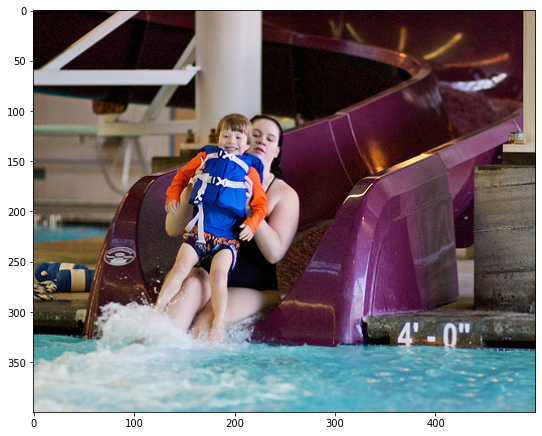

In [ ]:
def check_test(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  rid = np.random.randint(0, len(test_image_names))
  image_name = test_image_names[rid]
  real_caption = image_dict[image_name]

  image_path = image_dir + image_name
  result = evaluate(image_path, max_caption_words)

  # from IPython.display import Image, display
  # display(Image(image_path))
  print('Real Caption:', real_caption)
  print('Prediction Caption:', ' '.join(result))

  image_name = './Images/' + image_name
  img = Image.open(image_name)
  plt.figure(figsize = (9,9))
  plt.imshow(img)

  
df2 = pd.read_csv( "./Flickr_8k.testImages.txt")
test_image_names = set(df2['image'])
image_dir = image_path
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq beige and dark brown dog plays in the swimming pool with his mouth open endseq', 'startseq black and white dog trying to bite stream of water endseq', 'startseq dog is making splash in blue paddling pool endseq', 'startseq dog is splashing through water trying to catch ice in its mouth endseq', 'startseq dog playing in some water endseq']
Prediction Caption: dog in harness chasing ball in ears endseq


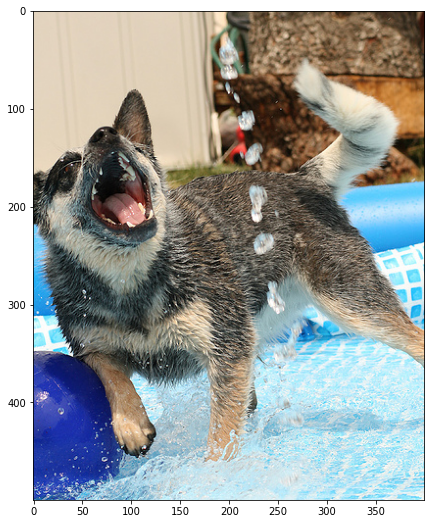

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq boy in dusty alley playing stickball endseq', 'startseq boy swings piece of wood endseq', 'startseq child swings bat next to stone wall endseq', 'startseq young boy wearing blue visor swings bat endseq', 'startseq young boy with visor on plays ball with his bat in the street endseq']
Prediction Caption: beach electric canvas mall of windy cushion endseq


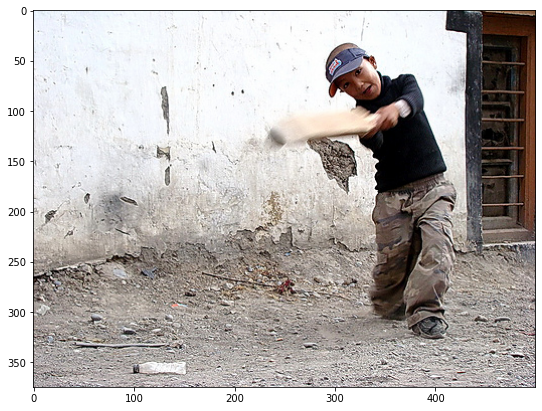

In [ ]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

In [ ]:
import nltk.translate.bleu_score as bleu
from nltk.translate.bleu_score import SmoothingFunction

smoothie = SmoothingFunction().method4

def bleu_score(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  bleu_score = []
  for id in range(len(test_image_names)):
  # for id in range(1):
    image_name = test_image_names[id]
    real_caption = image_dict[image_name]
    image_path = image_dir + image_name
    result = evaluate(image_path, max_caption_words)
    
    reference_translation = [str(real_caption[0]).split(),
                             str(real_caption[1]).split(),
                             str(real_caption[2]).split(),
                             str(real_caption[3]).split(),
                             str(real_caption[4]).split()
                            ]
    candidate_translation = result
    
    score = bleu.sentence_bleu(reference_translation, candidate_translation, smoothing_function=smoothie)
    # print(result)
    # print(reference_translation)
    # print(score)
    bleu_score.append(score)
  
  bleu_score_avg = sum(bleu_score) / len(bleu_score)
  return bleu_score_avg

score = bleu_score(list(test_image_names), image_dict, image_dir, max_caption_words)
print(score)

0.15718483041760586


# Image Caption Model with GRU

## Model

In [21]:
BATCH_SIZE = 1
BUFFER_SIZE = 1000

# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((train_X, train_y))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [22]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim, units):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.units = units
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.W1 = tf.keras.layers.Dense(self.units)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        x = self.W1(x)
        x = tf.reduce_mean(x, axis=1)
        # x = (batch_size, units)
        return x

In [23]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.rnn = tf.keras.layers.GRU(self.units, 
                                    return_sequences=True, 
                                    return_state=True,
                                    recurrent_initializer='glorot_uniform',
                                    kernel_regularizer=tf.keras.regularizers.l2(1e-8),
                                    stateful=True)
    
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

  def call(self, x, hidden):
    
    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # passing the concatenated vector to the LSTM
    output, hidden = self.rnn(x, initial_state = hidden)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, hidden

In [24]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
num_steps = len(train_X) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

encoder = CNN_Encoder(embedding_dim, units)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

In [25]:
def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## Checkpoint

In [26]:
checkpoint_path = "/content/drive/MyDrive/045195/Image Captioning/checkpoints/GRU/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=20)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print(start_epoch)

## Training

In [28]:
loss_plot = []
@tf.function
def train_step(img_tensor, target):
  loss = 0

  dec_input = tf.expand_dims([tokenizer.word_index['startseq']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      hidden = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden = decoder(dec_input, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [29]:
import time
start_epoch = 0
EPOCHS = 5

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if (batch+1) % 10000 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)
    ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 9999 Loss 1.4444
Epoch 1 Batch 19999 Loss 0.8764
Epoch 1 Batch 29999 Loss 1.7785
Epoch 1 Loss 1.301710
Time taken for 1 epoch 2418.11 sec

Epoch 2 Batch 9999 Loss 1.6567
Epoch 2 Batch 19999 Loss 1.2213
Epoch 2 Batch 29999 Loss 0.8025
Epoch 2 Loss 1.210496
Time taken for 1 epoch 2246.41 sec

Epoch 3 Batch 9999 Loss 1.1168
Epoch 3 Batch 19999 Loss 2.4293
Epoch 3 Batch 29999 Loss 1.2457
Epoch 3 Loss 1.197504
Time taken for 1 epoch 2267.55 sec

Epoch 4 Batch 9999 Loss 0.4893
Epoch 4 Batch 19999 Loss 0.8112
Epoch 4 Batch 29999 Loss 1.6192
Epoch 4 Loss 1.223130
Time taken for 1 epoch 2260.84 sec

Epoch 5 Batch 9999 Loss 0.6662
Epoch 5 Batch 19999 Loss 1.8791
Epoch 5 Batch 29999 Loss 0.5401
Epoch 5 Loss 1.276080
Time taken for 1 epoch 2249.98 sec



## Evaluate

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print(start_epoch)

3


In [30]:
def evaluate(image, max_length):

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    hidden = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['startseq']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden = decoder(dec_input, hidden)

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == 'endseq':
            return result

        dec_input = tf.expand_dims([predicted_id], 0)
        
    return result

Real Caption: ['startseq brown dog and black and white dog are running over grassy hills endseq', 'startseq two dogs are running next to each other on grassy hill endseq', 'startseq two dogs in motion in grassy field with small trees endseq', 'startseq two dogs play in field endseq', 'startseq two dogs running through field endseq']
Prediction Caption: two girls in parade endseq


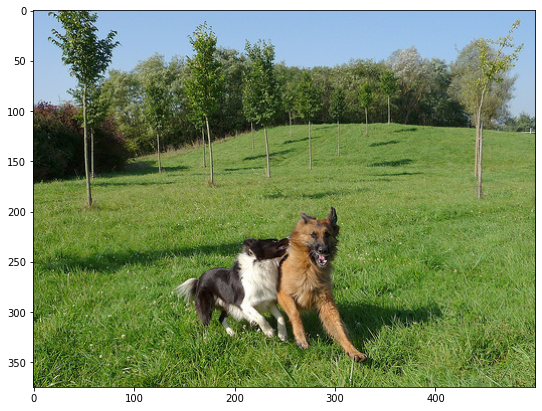

In [37]:
def check_test(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  rid = np.random.randint(0, len(test_image_names))
  image_name = test_image_names[rid]
  real_caption = image_dict[image_name]

  image_path = image_dir + image_name
  result = evaluate(image_path, max_caption_words)

  #from IPython.display import Image, display
  #display(Image(image_path))
  print('Real Caption:', real_caption)
  print('Prediction Caption:', ' '.join(result))

  image_name = './Images/' + image_name
  img = Image.open(image_name)
  plt.figure(figsize = (9,9))
  plt.imshow(img)

  
df2 = pd.read_csv( "./Flickr_8k.testImages.txt")
test_image_names = set(df2['image'])
image_dir = image_path
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

Real Caption: ['startseq baby girl in an orange dress gets wet as she stands next to water sprinkler endseq', 'startseq blonde toddler wearing an orange dress is wet and standing beside sprinkler in yard endseq', 'startseq child in dress is looking at sprinkler endseq', 'startseq little girl in an orange dress is running through the sprinkler in the yard endseq', 'startseq on wet grass little blond girl in orange dress plays in sprinkler endseq']
Prediction Caption: the water endseq


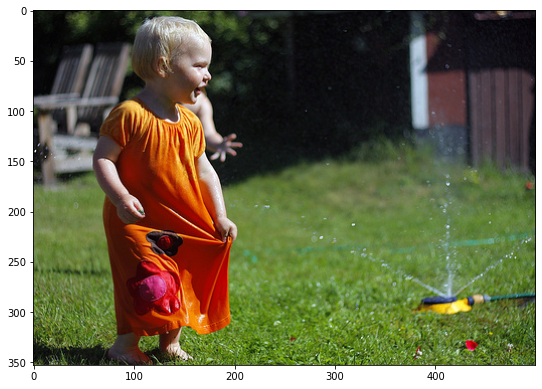

In [39]:
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)

In [54]:
import nltk.translate.bleu_score as bleu
from nltk.translate.bleu_score import SmoothingFunction

smoothie = SmoothingFunction().method4

def bleu_score(test_image_names, image_dict, image_dir, max_caption_words):
  # captions on the validation set
  bleu_score = []
  for id in range(len(test_image_names)):
  # for id in range(10,11):
    image_name = test_image_names[id]
    real_caption = image_dict[image_name]
    image_path = image_dir + image_name
    result = evaluate(image_path, max_caption_words)
    
    reference_translation = [str(real_caption[0]).split(),
                             str(real_caption[1]).split(),
                             str(real_caption[2]).split(),
                             str(real_caption[3]).split(),
                             str(real_caption[4]).split()
                            ]
    candidate_translation = result
    # print(candidate_translation)
    
    # result = 'endseq' make error
    if len(candidate_translation) != 1:
      score = bleu.sentence_bleu(reference_translation, candidate_translation, smoothing_function=smoothie)
      # print(reference_translation)
      # print(score)
      bleu_score.append(score)
  
  bleu_score_avg = sum(bleu_score) / len(bleu_score)
  return bleu_score_avg

score = bleu_score(list(test_image_names), image_dict, image_dir, max_caption_words)
print(score)

0.08395114771978178
